#### 시작과정
- fbprophet를 설치하기 위해 cython, pystan 설치

- Cython : CPython 확장 모듈을 손쉽게 생성하도록 고안된 컴파일 언어
- Pystan : 베이지안 추론을 위한 패키지인 stan에 대한 파이썬 인터페이스

In [1]:
!pip install cython

In [2]:
pip install "pystan<2.18"

  Using cached pystan-2.17.1.0.tar.gz (13.9 MB)
  Running setup.py clean for pystan
Failed to build pystan
  Attempting uninstall: pystan
    Found existing installation: pystan 2.18.0.0
    Uninstalling pystan-2.18.0.0:
      Successfully uninstalled pystan-2.18.0.0
    Running setup.py install for pystan: started
    Running setup.py install for pystan: finished with status 'error'
  Rolling back uninstall of pystan
  Moving to c:\anaconda\lib\site-packages\pystan
   from C:\anaconda\Lib\site-packages\~ystan
  Moving to c:\anaconda\lib\site-packages\pystan-2.18.0.0-py3.8.egg-info
   from C:\anaconda\Lib\site-packages\~ystan-2.18.0.0-py3.8.egg-info
Note: you may need to restart the kernel to use updated packages.


  ERROR: Command errored out with exit status 1:
   command: 'C:\anaconda\python.exe' -u -c 'import sys, setuptools, tokenize; sys.argv[0] = '"'"'C:\\Users\\이신행\\AppData\\Local\\Temp\\pip-install-jb5v7wb7\\pystan\\setup.py'"'"'; __file__='"'"'C:\\Users\\이신행\\AppData\\Local\\Temp\\pip-install-jb5v7wb7\\pystan\\setup.py'"'"';f=getattr(tokenize, '"'"'open'"'"', open)(__file__);code=f.read().replace('"'"'\r\n'"'"', '"'"'\n'"'"');f.close();exec(compile(code, __file__, '"'"'exec'"'"'))' bdist_wheel -d 'C:\Users\이신행\AppData\Local\Temp\pip-wheel-o05a_91u'
       cwd: C:\Users\이신행\AppData\Local\Temp\pip-install-jb5v7wb7\pystan\
  Complete output (16259 lines):
  Compiling pystan/_api.pyx because it depends on C:\anaconda\lib\site-packages\Cython\Includes\libcpp\string.pxd.
  Compiling pystan/_chains.pyx because it depends on C:\anaconda\lib\site-packages\Cython\Includes\libcpp\vector.pxd.
  [1/2] Cythonizing pystan/_chains.pyx
  [2/2] Cythonizing pystan/_api.pyx
  C:\anaconda\lib\site-packages\

  copying pystan\stan\lib\stan_math\lib\boost_1.64.0\boost\mem_fn.hpp -> build\lib.win-amd64-3.8\pystan\stan\lib\stan_math\lib\boost_1.64.0\boost
  copying pystan\stan\lib\stan_math\lib\boost_1.64.0\boost\metaparse.hpp -> build\lib.win-amd64-3.8\pystan\stan\lib\stan_math\lib\boost_1.64.0\boost
  copying pystan\stan\lib\stan_math\lib\boost_1.64.0\boost\mpi.hpp -> build\lib.win-amd64-3.8\pystan\stan\lib\stan_math\lib\boost_1.64.0\boost
  copying pystan\stan\lib\stan_math\lib\boost_1.64.0\boost\multi_array.hpp -> build\lib.win-amd64-3.8\pystan\stan\lib\stan_math\lib\boost_1.64.0\boost
  copying pystan\stan\lib\stan_math\lib\boost_1.64.0\boost\multi_index_container.hpp -> build\lib.win-amd64-3.8\pystan\stan\lib\stan_math\lib\boost_1.64.0\boost
  copying pystan\stan\lib\stan_math\lib\boost_1.64.0\boost\multi_index_container_fwd.hpp -> build\lib.win-amd64-3.8\pystan\stan\lib\stan_math\lib\boost_1.64.0\boost
  copying pystan\stan\lib\stan_math\lib\boost_1.64.0\boost\next_prior.hpp -> build\li

In [2]:
# 기술지표 분석을 위한 pandas_ta 설치
!pip install pandas_ta 
# 시계열 분석 기능의 공배을 채우기 위한 통계 라이브러리인 pmarima 설치
!pip install pmdarima
# 시계열 분석 모듈 설치
!pip install fbprophet
# 구글 트렌드 데이터를 가져오는데 필요한 라이브러리 설치
!pip install pytrends

In [7]:
# 웹상의 데이터를 dataframe객체로 만드는 기능
!pip install pandas-datareader

In [1]:
# 라이브러리 불러오기
import random 
import pandas_ta as ta
import numpy as np 
import pandas as pd 
import plotly.express as px
import seaborn as sns

import matplotlib.pyplot as plt
import plotly.graph_objects as go
import matplotlib.ticker as ticker
import plotly.figure_factory as ff

from fbprophet import Prophet
from pandas_datareader import data
from scipy import stats
from statsmodels.tsa.seasonal import seasonal_decompose
from fbprophet.plot import plot_plotly, plot_components_plotly
from pmdarima.arima import auto_arima
from pytrends.request import TrendReq
from sklearn.preprocessing import MinMaxScaler

from matplotlib.ticker import FixedFormatter, FixedLocator

## 재고 데이터 찾기

In [2]:
# 테이블 지정 함수
def show_table(dataframe):
    colorscale = [[0, '#4d004c'],[.5, '#f2e5ff'],[1, '#ffffff']]
    fig = ff.create_table(dataframe,colorscale=colorscale,index=True)
    for i in range(len(fig.layout.annotations)): # 각 사전에 아래 나열된 키 중 하나 이상이 있는 사전 목록
        fig.layout.annotations[i].font.size = 14 # 글자 크기 조정
    fig.show()

# 소수점 지정
def dataframe_format(df,columns):
    for column in columns:
        df[column] = df[column].round(3) # 소수점 3자리 밑에서 반올림
    return df
# 인덱스 지정
def format_index(df: dict):
    df['DateIndex'] = df.index
    df['DateIndex'] = pd.to_datetime(df['DateIndex']).dt.date # yyyy-mm-dd
    return df

# DataReader을 통해 데이터 다운로드
def download_dataframe(name:str,start_date:str,end_date:str):
    df=data.DataReader(name=name,data_source='yahoo',start=start_date,end=end_date)
    for column in ['High','Low','Open','Close','Adj Close']:
        df[column] = df[column].round(3)
        
        return df

# 주가 데이터 다운로드, 저장
def download_list_stocks(stocks: list, field: str, start_date: str, end_date: str):
    stocks_dataframe = pd.DataFrame()
    for stock in stocks:
        stocks_dataframe[stock] = download_dataframe(stock, start_date=start_date, end_date=end_date)[field]
    return stocks_dataframe

# 랜덤한 색깔 지정 함수
def get_random_color():
    r1 = lambda : random.randint(0,255)
    return '#%02X%02X%02X' % (r1(),r1(),r1())

def save_dataframe(df:dict,file_path:str):
    df.read_csv(filepath)
    print('Success saved!')
    
dataframe=download_dataframe(name='PETR3.SA',start_date='2018-01-01',end_date='2022-01-01')

In [3]:
# 주식 데이터를 데이터프레임으로 만들어 가져오기
dataframe = format_index(dataframe)
show_table(dataframe.head(10))

In [4]:
dataframe.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 989 entries, 2018-01-02 to 2021-12-30
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   High       989 non-null    float64
 1   Low        989 non-null    float64
 2   Open       989 non-null    float64
 3   Close      989 non-null    float64
 4   Volume     989 non-null    float64
 5   Adj Close  989 non-null    float64
 6   DateIndex  989 non-null    object 
dtypes: float64(6), object(1)
memory usage: 61.8+ KB


In [5]:
# 데이터 요약 확인
show_table(pd.DataFrame(dataframe.describe()))

In [6]:
# High가 21이상인 데이터만 출력
show_table(dataframe[dataframe['High']>=21.00].head(10))

## 캔들차트로 보기
- 캔들차트 생성을 위해서 Candlestick 함수를 호출한다. mplfinance와 다르게 인덱스 및 open, high, low, close 인자를 설정해야 한다. 

- Showgrid : 격자선을 그릴지 여부를 결정합니다. "True"이면 모든 눈금에 격자선이 그려집니다.

- Gridwidth : 격자 넓이 설정, 기본값 : !

In [7]:
def get_candles_plot(df:dict,title:str,stock_name=''):
    fig=go.Figure(data=[go.Candlestick(x=dataframe['DateIndex'],
                                      open=dataframe['Open'],
                                      high=dataframe['High'],
                                      low=dataframe['Low'],
                                      close=dataframe['Close'])])
    fig.update_xaxes(showgrid=True,gridwidth=1,gridcolor='LightPink')
    fig.update_yaxes(showgrid=True,gridwidth=1,gridcolor='LightPink')
    fig.update_layout(title=f'{title}:{stock_name}',paper_bgcolor='white',
                     plot_bgcolor='white',font_color='black')
    fig.show()
    
get_candles_plot(dataframe,'Stock price','PETR3.SA')

- bgcolor : 범위 선택기 버튼의 배경색 설정

In [8]:
fig = px.bar(dataframe,x='DateIndex',y='Volume')
fig.update_layout(title=f'Trading volumne : PETR3.SA',barmode='stack',paper_bgcolor='white',
                 plot_bgcolor='white',font_color='black')
fig.show()

## 이동 평균

In [9]:
# ta.sma를 통해 단순 이동평균 구하기
dataframe.ta.sma(close='Close', length=5, append=True)
dataframe.ta.sma(close='Close', length=10, append=True)
dataframe.ta.sma(close='Close', length=20, append=True)
dataframe.ta.sma(close='Close', length=200, append=True)
dataframe.ta.ema(close='Close', length=5, append=True)

Date
2018-01-02          NaN
2018-01-03          NaN
2018-01-04          NaN
2018-01-05          NaN
2018-01-08    17.708000
                ...    
2021-12-23    30.478538
2021-12-27    30.665692
2021-12-28    30.797128
2021-12-29    30.848085
2021-12-30    30.798724
Name: EMA_5, Length: 989, dtype: float64

In [10]:
dataframe = dataframe_format(dataframe, ["SMA_5", "SMA_10", "SMA_20", "SMA_200", "EMA_5"])
show_table(dataframe.head(10))

In [11]:
# 이동평균을 포함한 캔들스틱 그래프로 보기
def get_candles_plot_avg(df:dict,title:str,stock_name='',average_fields=False):
    fig=go.Figure(data=go.Candlestick(x=dataframe['DateIndex'],
                                     open=dataframe['Open'],
                                     high=dataframe['High'],
                                     low=dataframe['Low'],
                                     close=dataframe['Close']))
    
    if average_fields:
        for field_avg,colors in zip(average_fields['avg_mov'],
                                   average_fields['colors']):
            fig.add_trace(
                go.Scatter(
                    x=df.index,
                    y=df[field_avg],
                    line=dict(color=colors,width=2),
                    name=field_avg
                )
            )
    fig.update_xaxes(showgrid=True,gridwidth=1,gridcolor='LightPink')
    fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='LightPink')
    fig.update_layout(title=f'{title}: {stock_name}', width=1800, height=900, paper_bgcolor='white', plot_bgcolor="white", font_color="black")
    fig.show()
# 이동평균 반영   
settings_avg={'avg_mov':['SMA_10','SMA_20','SMA_200'],'colors':['blue','pink','purple']}
get_candles_plot_avg(dataframe,'Stock price','PETR3.SA',settings_avg)

## 특정 날짜 이전의 주가 데이터 이동평균만 표시

In [12]:
from datetime import datetime
from datetime import timedelta

date_time_filter = '2019-01-05'
datetime_filter = dataframe[dataframe.index <= date_time_filter]
settings_avg = {"avg_mov": ["SMA_10", "SMA_20", "SMA_200"], "colors": ["blue", "pink", "purple"]}
get_candles_plot_avg(datetime_filter, 'Stock price <= 2019-01-05', 'PETR3.SA', settings_avg)

## 지갑의 재고 리스트 비교

In [13]:
stocks_list = ["VALE3.SA", "BBDC3.SA", "ITSA3.SA", "ITUB3.SA", "BBAS3.SA", 
               "PETR3.SA", "VALE3.SA", "JBSS3.SA", "OIBR3.SA", "GOLL4.SA", 
               "IRBR3.SA", "CIEL3.SA", "MGLU3.SA"]
dataframe_stocks = download_list_stocks(stocks_list, "Close", "2014-01-01", "2022-01-01")
#show_table(dataframe_stocks.head(100))

In [14]:
# null 값 확인하고 삭제
dataframe_stocks.isnull().sum()
dataframe_stocks.dropna(inplace=True)

In [15]:
# Histplot으로 그리기
def get_stocks_histplot(df:dict,stocks:list):
    for index,stock in enumerate(stocks):
        f, (ax1) = plt.subplots(1,1,figsize=(14,2))
        v_dist_1 = df[f"{stock}"].values
        sns.histplot(v_dist_1,ax=ax1,color=get_random_color(),kde=True)
        ax1.set_title(f'{stock}: Close',fontsize=15)

# 위의 그래프에서 평균, 중앙값, 최빈값 포함해서 그리기
def get_stock_histplot_central_tendency(df:dict,stocks:list):
    for index,stock in enumerate(stocks):
        f, (ax1)=plt.subplots(1,1,figsize=(14,5))
        v_dist_1=df[f'{stock}'].values
        sns.histplot(v_dist_1,ax=ax1,color=get_random_color(),kde=True)
        
        mean=df[f"{stock}"].mean() # 평균
        median=df[f"{stock}"].median() # 중앙값
        mode=df[f"{stock}"].mode().values[0] # 최빈값'
        
        # axvline : 축을 따라 수직선 표시
        ax1.axvline(mean, color='r', linestyle='--', label="Mean")
        ax1.axvline(median, color='g', linestyle='-', label="Mean")
        ax1.axvline(mode, color='b', linestyle='-', label="Mode")
        ax1.legend()

In [16]:
dataframe_stocks=format_index(dataframe_stocks)
show_table(dataframe_stocks.head(4))

In [17]:
# Scatter plot으로 각 종목마다 주가 변동 표현
def stock_plot_line(df: dict, stocks: list, title=''):
    fig = go.Figure()
    for stock in stocks:
        fig.add_trace(go.Scatter(x=df['DateIndex'], y=df[stock],
                    mode='lines', # scatter plot을 그리기 위한 markers
                    name=stock))
    fig.update_layout(title=title, paper_bgcolor='white', plot_bgcolor="white", font_color="black")
    fig.show()

stock_plot_line(dataframe_stocks, stocks_list, title='Stocks price - close')

## 재고(stocks) Histrogram

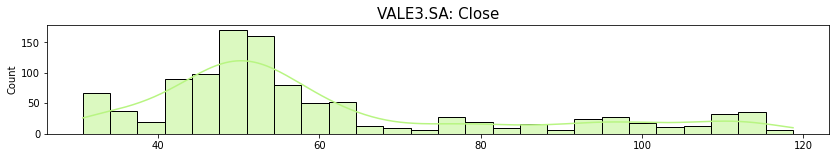

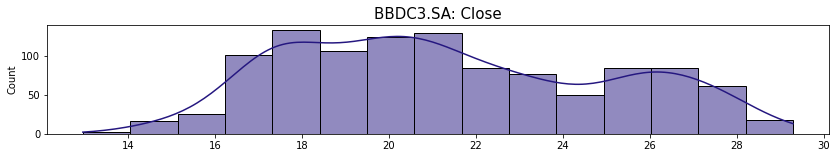

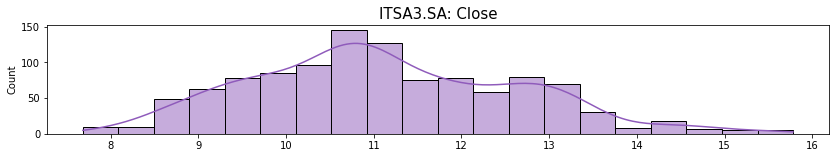

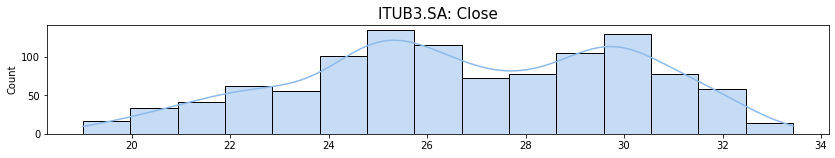

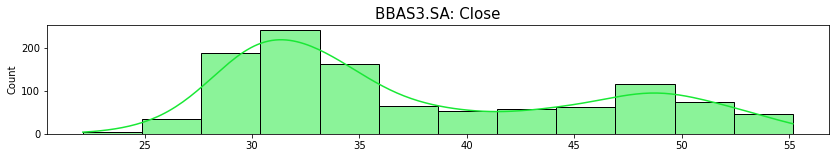

...

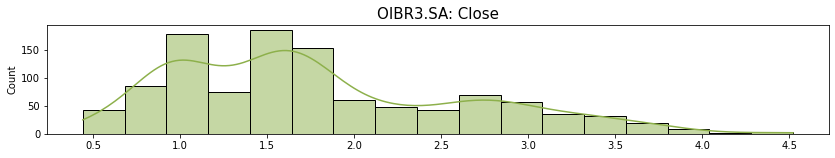

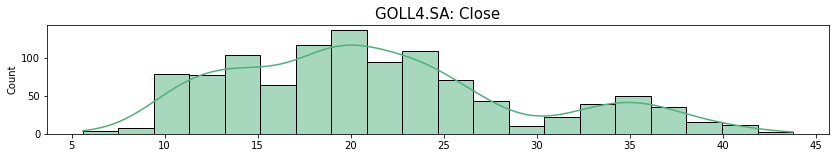

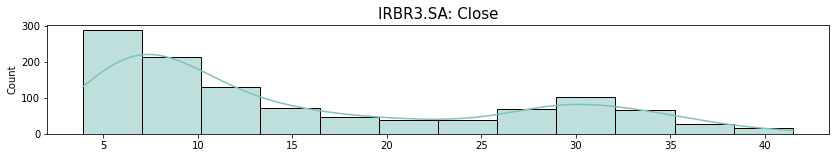

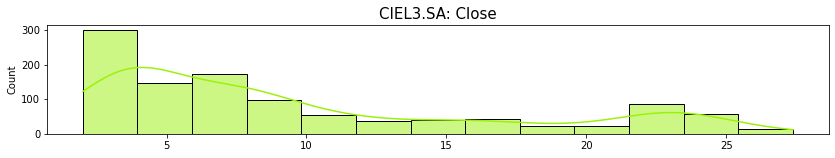

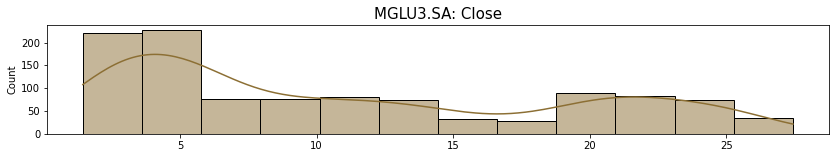

In [18]:
get_stocks_histplot(dataframe_stocks, stocks_list)

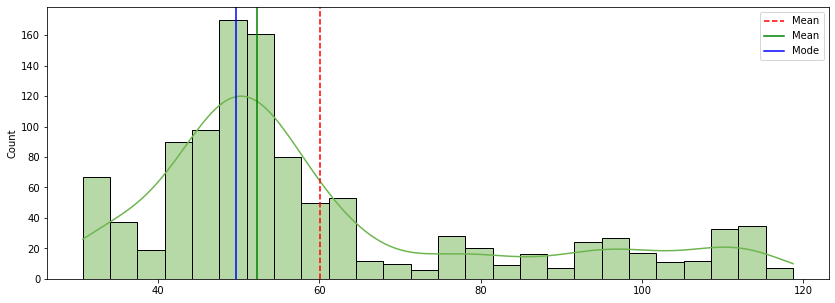

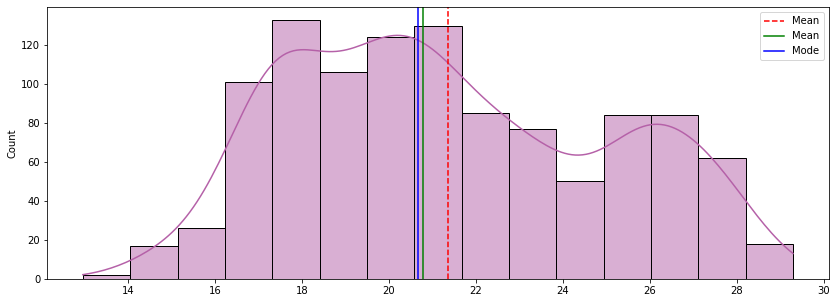

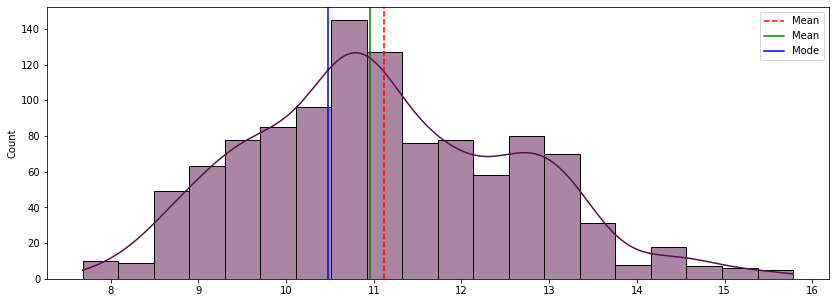

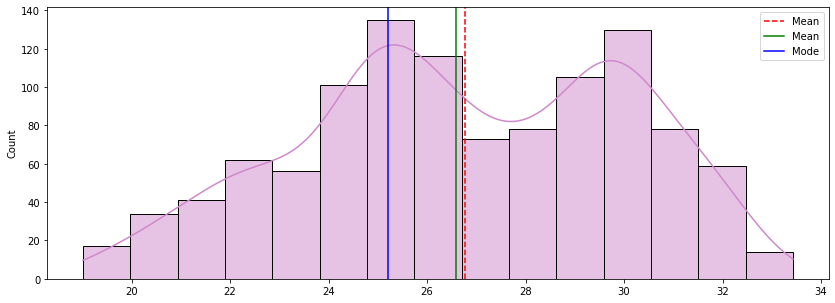

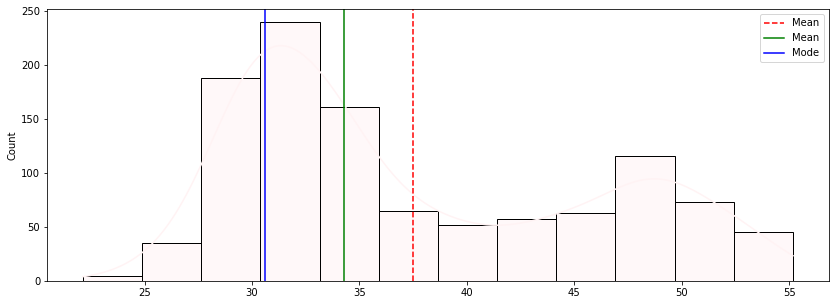

...

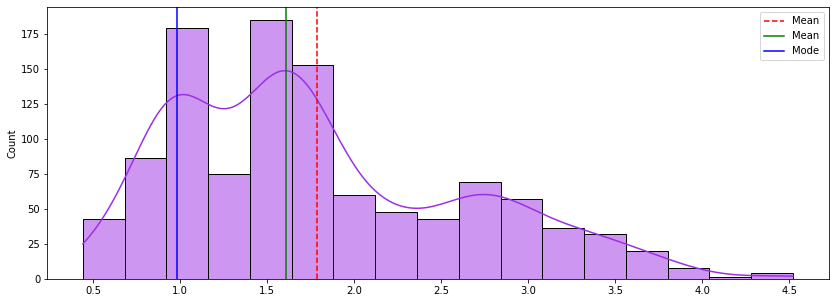

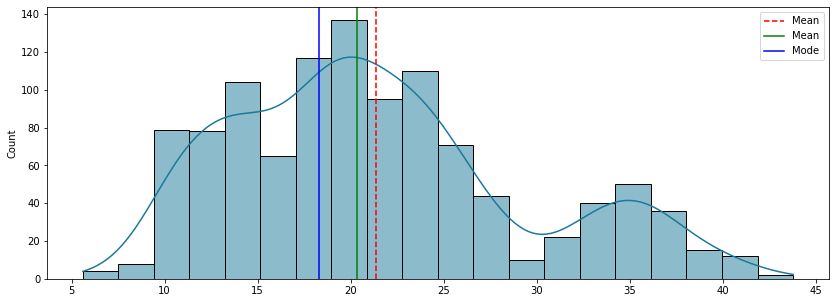

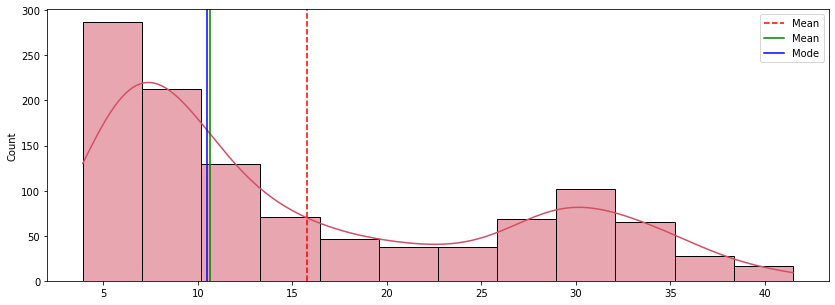

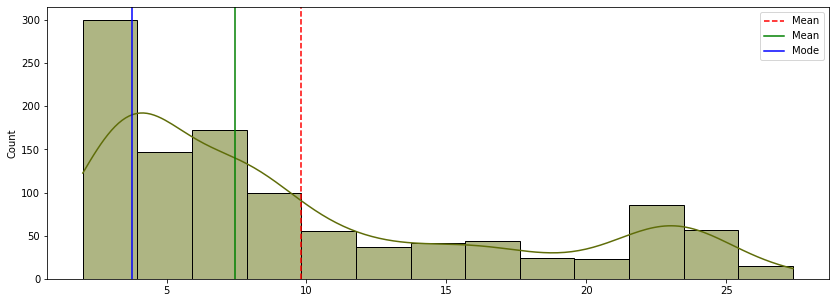

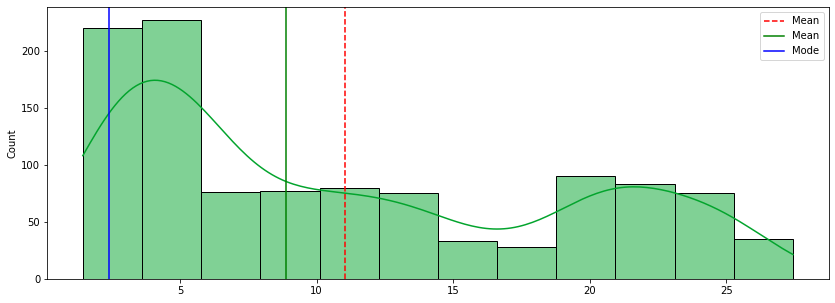

In [19]:
get_stock_histplot_central_tendency(dataframe_stocks, stocks_list)

### 종목별로 기간별 변화 파악

2017         AxesSubplot(0.1,0.679412;0.363636x0.220588)
2018    AxesSubplot(0.536364,0.679412;0.363636x0.220588)
2019         AxesSubplot(0.1,0.414706;0.363636x0.220588)
2020    AxesSubplot(0.536364,0.414706;0.363636x0.220588)
2021             AxesSubplot(0.1,0.15;0.363636x0.220588)
dtype: object

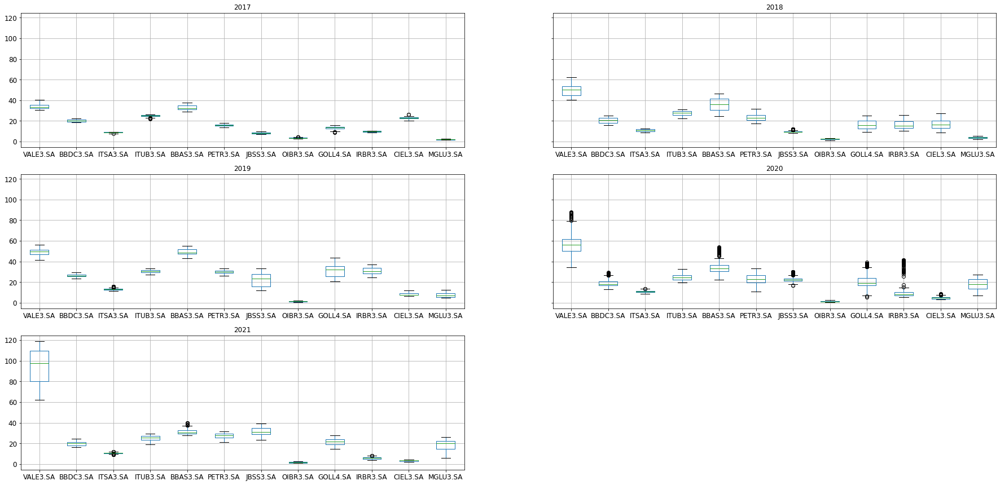

In [20]:
dataframe_stocks.groupby(dataframe_stocks.index.year).boxplot(figsize=(30,15),fontsize=12)

In [21]:
# 정규화 함수
def get_data_normalize(df:dict):
    dataframe_stocks_norm = df.copy()
    for stock in dataframe_stocks_norm.columns[:-1]:
        dataframe_stocks_norm[stock] = round(dataframe_stocks_norm[stock] / dataframe_stocks_norm[stock][0],3)
        return dataframe_stocks_norm

In [22]:
dataframe_stocks_norm = get_data_normalize(dataframe_stocks)
show_table(dataframe_stocks_norm.head(10))

In [23]:
stock_plot_line(dataframe_stocks_norm, stocks_list, title='Stocks price - close: normalized')

## 리턴 비율

In [24]:
def get_rate_return_log(df:dict,stock_name:str):
    return np.log(df[stock_name][len(df)-1] / df[stock_name][0])

# 일별 리턴 비율 - shift를 이용하여 원하는 수 만큼 시프트 가능
# 시리즈 객체의 값이 하나씩 내려감
def get_rate_return_daily(df:dict,stock_name:str):
    return (df[stock_name] / df[stock_name].shift(1)) -1 

def get_rate_return(Df:dict,stock_name:str):
    Xfinal=df[stock_name][len(df)-1]
    Xstart=df[stock_name][0]
    stock_return_rate=round(((Xfinal-Xstart) / Xstart) * 100,1)
    return stock_return_rate

def get_all_rate_return_daily(df:dict,stock_name:str):
    return (df[stock_name] / df[stock].shift(1)) -1

# 리턴 비율
def get_rate_return(df: dict, stock_name: str):
    Xfinal = df[stock_name][len(df) - 1]
    Xstart = df[stock_name][0]
    stock_return_rate = round(((Xfinal - Xstart) / Xstart) * 100, 1)
    return stock_return_rate

# 일간 리턴 비율
def get_all_rate_return_daily(df: dict, stock_list: list):
    df_copy = df.copy()
    for stock in stock_list:
        df_copy[f"{stock}_Rate"] = get_rate_return_daily(df_copy, stock)
    return df_copy


def get_all_rate_return_log(df: dict, stock_list: list):
    stock_name = list()
    stock_value = list()
    for stock in stock_list:
        stock_name.append(stock)
        stock_value.append(get_rate_return_log(df, stock))
    return {'stock': stock_name, 'rate': stock_value}

def get_all_rate_return(df: dict, stock_list: list):
    stock_name = list()
    stock_value = list()
    for stock in stock_list:
        stock_name.append(stock)
        stock_value.append(get_rate_return(df, stock))
    return {'stock': stock_name, 'rate': stock_value}

In [25]:
stock_rate_return=get_all_rate_return(dataframe_stocks,stocks_list)
stock_rate_return_log=get_all_rate_return_log(dataframe_stocks,stocks_list)
stock_rate_return_daily=get_all_rate_return_daily(dataframe_stocks,stocks_list)

stock_rate_return=pd.DataFrame.from_dict(stock_rate_return)
stock_rate_return_log=pd.DataFrame.from_dict(stock_rate_return_log)
show_table(stock_rate_return.head())

In [26]:
show_table(stock_rate_return_log.head())

In [27]:
stock_rate_return['Color']=np.where(stock_rate_return['rate']<0,'red','green')
stock_rate_return_log['Color']=np.where(stock_rate_return_log['rate']<0,'red','green')
show_table(stock_rate_return.head())

In [28]:
show_table(stock_rate_return_log.head())

In [29]:
# 리턴율 나타내는 그래프
def get_plot_rate_return(stock_rate_return:dict):
    fig=go.Figure()
    fig.add_trace( # 정해진 레이아웃에 그래프 그림
        go.Bar(name='rate',
              x=stock_rate_return['stock'],
              y=stock_rate_return['rate'],
              marker_color=stock_rate_return['Color']))
    fig.update_layout(barmode='stack',title='Rate return in period',paper_bgcolor='white',
                     plot_bgcolor='white',font_color='black')
    fig.show()
get_plot_rate_return(stock_rate_return)

## 수익률

In [30]:
wallet_stock_list=['PETR3.SA','GOLL4.SA','CIEL3.SA']
create_stock_wallet=download_list_stocks(wallet_stock_list,'Close','2019-01-01','2022-01-01')
show_table(create_stock_wallet.head(10))

In [31]:
# 인덱스 칼럼을 DateIndex 명으로 추가하여 갖고 오기
create_stock_wallet = format_index(create_stock_wallet)
create_stock_wallet_norm = get_data_normalize(create_stock_wallet)
create_stock_wallet_norm.drop(labels=['DateIndex'], axis=1, inplace=True)
wallet_return = (create_stock_wallet_norm / create_stock_wallet_norm.shift(1)) - 1
wallet_weight = np.array([0.2, 0.4, 0.4])
show_table(create_stock_wallet.head(10))

In [32]:
# 시각화
stock_plot_line(create_stock_wallet,wallet_stock_list,title='Stocks price wallet - close : normalized')

In [33]:
year_return_rate = wallet_return.mean() * 246

#### Indicator
 - value: 시각화할 값
 - mode: 그릴 시각적 요소
 - align: 숫자와 델타를 정렬하는 방법(왼쪽, 가운데, 오른쪽)
 - domain: 그림의 범위

In [34]:
def plot_indicator_return(value):
    fig=go.Figure()
    color='green'
    if value < 0:
        color='red'
    if value ==0:
        color='black'
        
    fig.add_trace(go.Indicator(number={'font_color':color},
                              mode='number+delta',
                              value=value*100,
                              title={'text':'Rate Wallet %'},
                              domain={'x':[0,0.5],'y':[0,0.5]}))
    
    fig.show()
    
plot_indicator_return(np.dot(year_return_rate,wallet_weight))

## 연간 리턴 비율

In [35]:
stocks_std=dataframe_stocks.describe()

In [36]:
show_table(pd.DataFrame(stocks_std.iloc[2]))

In [37]:
def year_rate_return (df:str,start_date:str,end_date:str,stock_list:list):
    ret_value=dict()
    for stock_name in stock_list:
        xi_v=df[stock_name][df.index==start_date].tolist()
        yi_v=df[stock_name][df.index==end_date].tolist()
        if xi_v and yi_v:
            rate=round(np.log(yi_v[0] / xi_v[0]) * 100,2)
            ret_value[stock_name] = rate
    return ret_value

In [38]:
year_rate=year_rate_return(dataframe_stocks,'2020-01-04','2020-12-30',stocks_list)

In [39]:
filter_dates = [
            {"s": "2018-01-02", "f": "2018-12-27"},
            {"s": "2019-01-02", "f": "2019-12-27"},
            {"s": "2020-01-02", "f": "2020-12-30"},
            {"s": "2021-01-04", "f": "2021-12-30"},
]
rate_lst=[]
for filter_date in filter_dates:
    xi,yi=filter_date['s'],filter_date['f']
    rate_stocks=year_rate_return(dataframe_stocks,xi,yi,['MGLU3.SA'])
    rate_lst.append(rate_stocks['MGLU3.SA'])
    
rate_lst=np.array(rate_lst)

## 위험 분석 - 가변 및 표준 사용 

In [40]:
avg_stock=round(rate_lst.mean(),2)
var_stock=round(rate_lst.var(),2)
std_stock=round(rate_lst.std(),2)

print(f'MGLU3.SA, avg:{avg_stock}, var:{var_stock}, std:{std_stock}')

MGLU3.SA, avg:24.51, var:7459.37, std:86.37


## 분산 계수 - 위험

In [41]:
r_value = {}
avaliation_stocks = ["OIBR3.SA", "MGLU3.SA"]
for avaliation in avaliation_stocks:
    r_value[avaliation] = []
    
for filter_date in filter_dates:
    xi, yi = filter_date["s"], filter_date["f"]
    rate_stocks = year_rate_return(dataframe_stocks, xi, yi, avaliation_stocks)
    for stock_name in rate_stocks:
        r_value[stock_name].append(rate_stocks[stock_name])
    
df_avaliation_compare = pd.DataFrame(r_value)
show_table(df_avaliation_compare)

In [42]:
show_table(df_avaliation_compare.describe())

## 상관관계

In [43]:
import math

def get_return_rate(df:dict):
    return(df/df.shift(1)) -1

def get_return_rate_norm(df:dict):
    df_year=df.std()*math.sqrt(246)
    return df_year

dataframe_sample = dataframe_stocks.copy()
dataframe_sample.drop(labels=['DateIndex'],axis=1,inplace=True)
dataframe_sample_return_rate=get_return_rate(dataframe_sample)

In [44]:
dataframe_sample_return_rate_norm=get_return_rate_norm(dataframe_sample_return_rate)
round(dataframe_sample_return_rate_norm*100,2)

VALE3.SA    40.25
BBDC3.SA    37.69
ITSA3.SA    27.05
ITUB3.SA    30.96
BBAS3.SA    41.58
PETR3.SA    48.43
JBSS3.SA    44.26
OIBR3.SA    65.78
GOLL4.SA    71.20
IRBR3.SA    56.89
CIEL3.SA    51.74
MGLU3.SA    56.40
dtype: float64

In [45]:
def get_headmap_stocks(df: dict, correlation_type: str):
    plt.figure(figsize=(18, 18))
    if correlation_type == "corr":
        sns.heatmap(df.corr(), annot=True, cmap='BrBG_r') # 상관관계
        plt.title("Correlation stock - return rate")
    if correlation_type == "cov":
        sns.heatmap(df.cov(), annot=True, cmap='BrBG_r') # 공분산
        plt.title("Covariance stock - return rate")

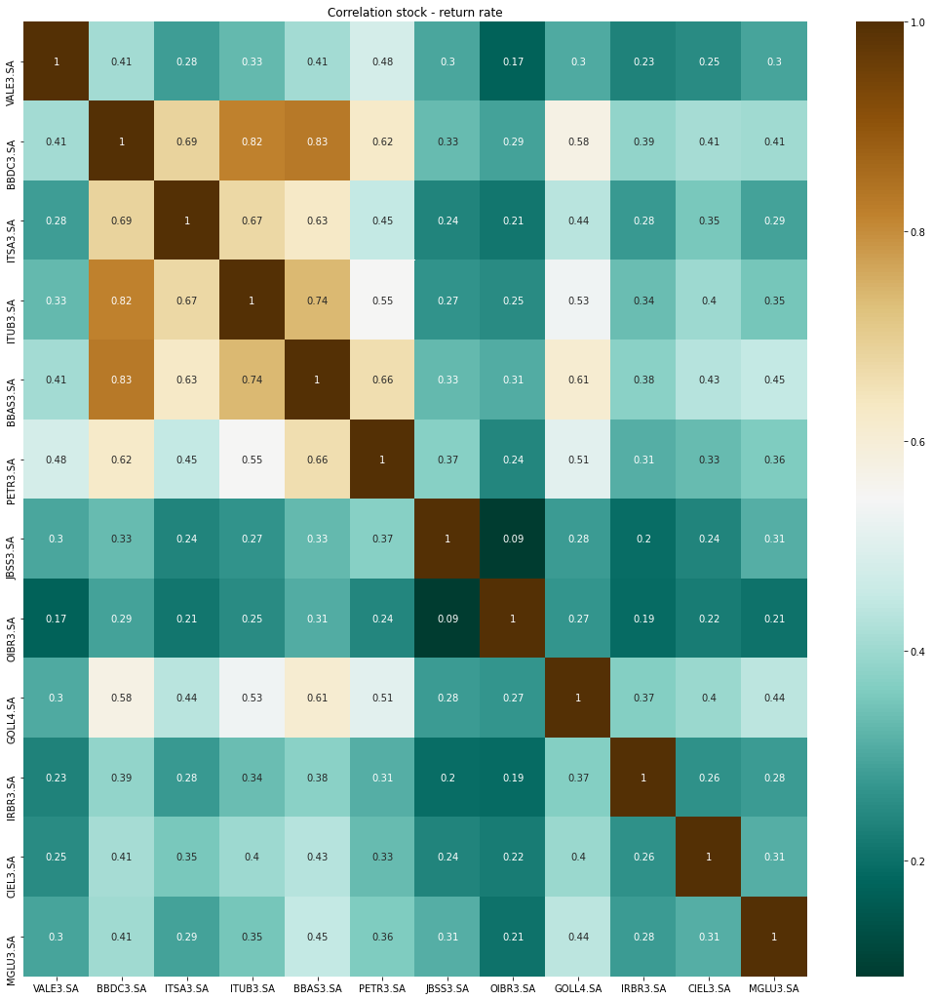

In [46]:
get_headmap_stocks(dataframe_sample_return_rate, "corr")

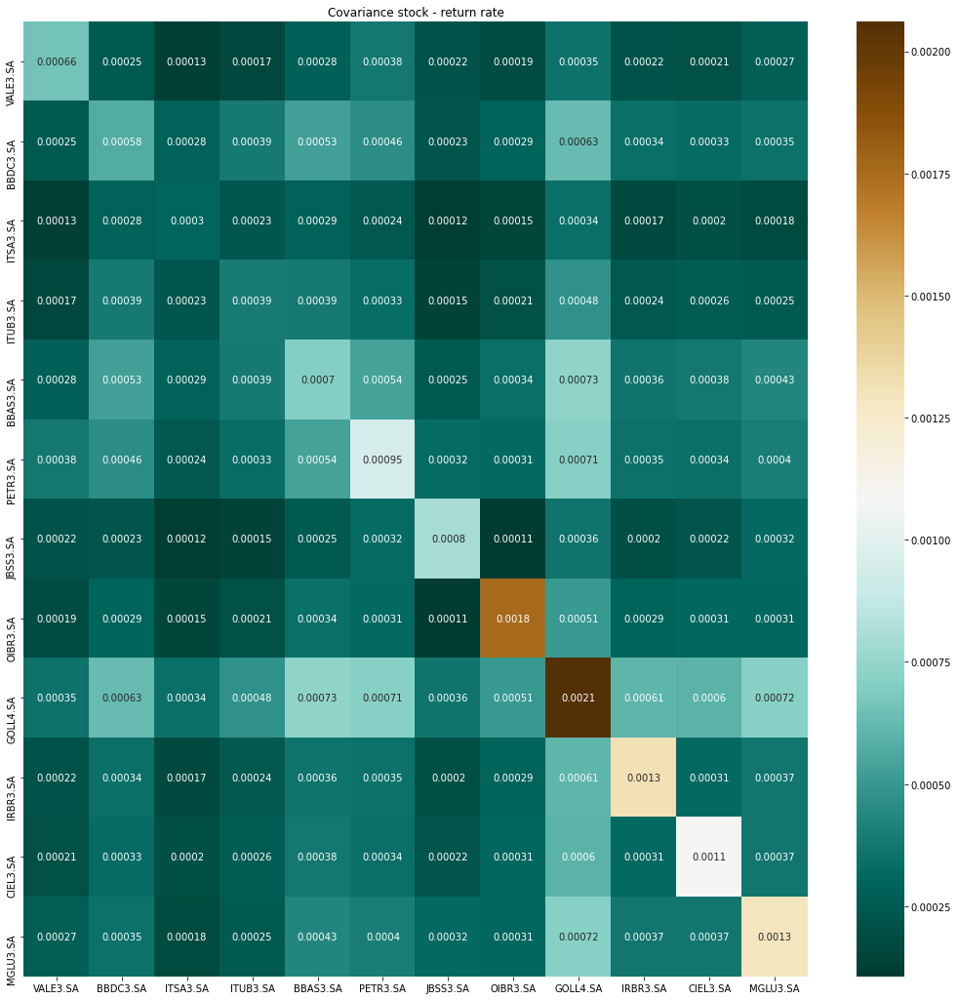

In [47]:
get_headmap_stocks(dataframe_sample_return_rate, "cov")

## Google 동향(trend) : Crypto 검색

- 비트코인, 도지코인, 시바 이누의 경향 파악

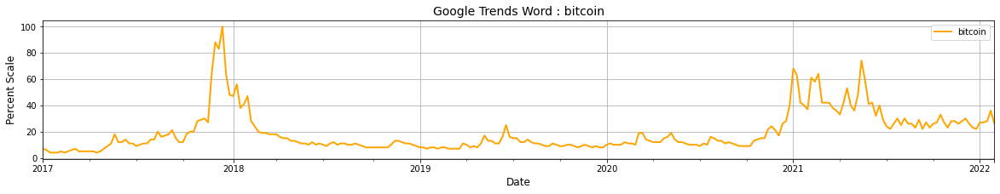

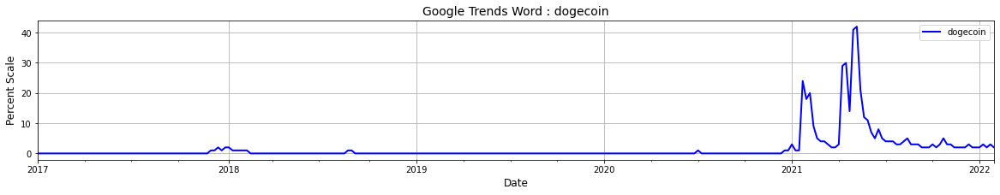

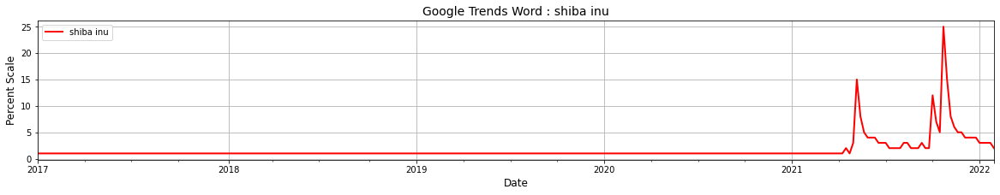

In [48]:
def search_google_trends(word:list,timeframe:str):
    google_trends=TrendReq()
    google_trends.build_payload(word,timeframe=timeframe)
    return google_trends.interest_over_time()

def plot_trend(df:dict,word:str,color:list):
    plt.figure(figsize=(20,3))
    df[word].plot(lw=2,color=color)
    plt.xlabel('Date',fontsize=12)
    plt.ylabel('Percent Scale',fontsize=12)
    plt.title(f'Google Trends Word : {word}',fontsize=14)
    plt.legend()
    plt.grid()
    
timeframe='2017-01-01 2022-02-01'
word_list=['bitcoin','dogecoin','shiba inu']
color_list=['orange','blue','red']
dataframe_trends=search_google_trends(word_list,timeframe=timeframe)
for word,color in zip(word_list,color_list):
    plot_trend(dataframe_trends,word,color)

In [49]:
show_table(dataframe_trends.head(10))

In [50]:
list_crypto = ["BTC-USD", "DOGE-USD", "SHIB-USD"]
start_date,end_date=timeframe.split(' ')
dataframe_stock_total=download_list_stocks(list_crypto,'High',start_date,end_date)
dataframe_stock_total=dataframe_stock_total.fillna(0)
dataframe_stock_total['DateIndex']=pd.to_datetime(dataframe_stock_total.index,unit='s') # 초단위지
show_table(dataframe_stock_total.head(10))

In [51]:
def preprocessor_min_max(df: dict, field: str):
    min_max = MinMaxScaler()
    scaled = min_max.fit_transform(df[field].values.reshape(-1, 1))
    df["MinMax"] = scaled * 100
    return df

def preprocessor_min_max_all(df: dict, field_list: list):
    min_max = MinMaxScaler()
    for field in field_list:
        scaled = min_max.fit_transform(df[field].values.reshape(-1, 1))
        df[f"MinMax_{field}"] = scaled * 100
    return df
    
    
dataframe_stock_total = preprocessor_min_max_all(dataframe_stock_total, list_crypto)
show_table(dataframe_stock_total.head(10))

In [52]:
dataframe_stock_total.head(10)

,BTC-USD,DOGE-USD,SHIB-USD,DateIndex,MinMax_BTC-USD,MinMax_DOGE-USD,MinMax_SHIB-USD
Date,,,,,,,
2016-12-31,963.743,0.0,0.0,2016-12-31,0.206626,0.0,0.0
2017-01-01,1003.080,0.0,0.0,2017-01-01,0.264503,0.0,0.0
2017-01-02,1031.390,0.0,0.0,2017-01-02,0.306156,0.0,0.0
2017-01-03,1044.080,0.0,0.0,2017-01-03,0.324827,0.0,0.0
2017-01-04,1159.420,0.0,0.0,2017-01-04,0.494529,0.0,0.0
2017-01-05,1191.100,0.0,0.0,2017-01-05,0.541140,0.0,0.0
2017-01-06,1046.810,0.0,0.0,2017-01-06,0.328844,0.0,0.0
2017-01-07,908.585,0.0,0.0,2017-01-07,0.125471,0.0,0.0
2017-01-08,942.724,0.0,0.0,2017-01-08,0.175700,0.0,0.0


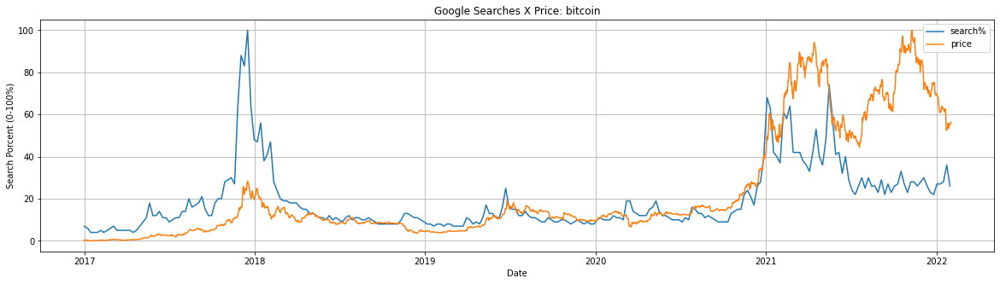

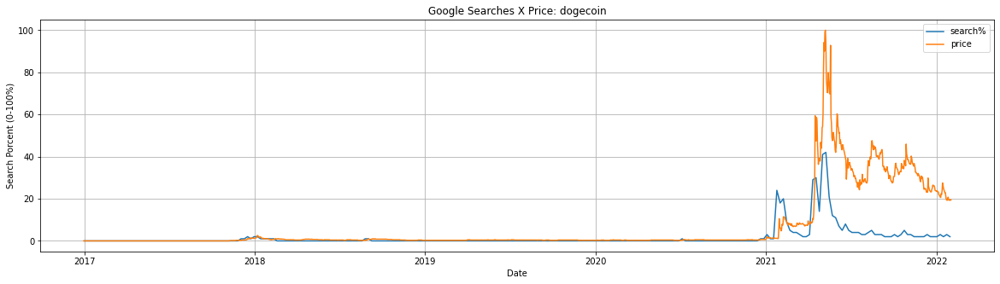

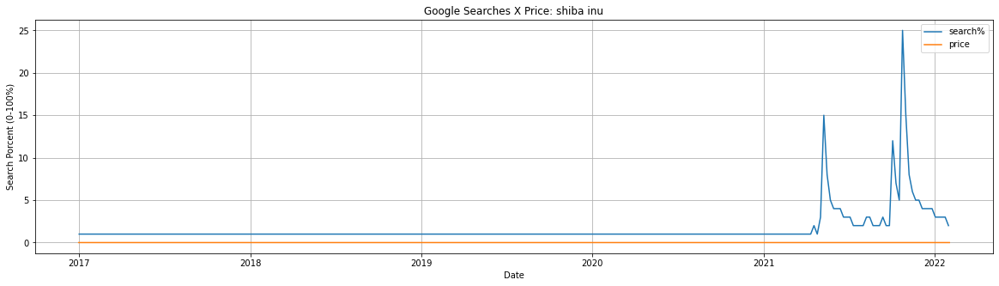

In [53]:
def plot_compare_trends_price(df_trends: dict, df_stocks: dict, word: str):
    fig, ax = plt.subplots(figsize=(20, 5))
    ax.set_title(f"Google Searches X Price: {word}")
    ax.set_xlabel("Date")
    ax.set_ylabel("Search Porcent (0-100%)")
    ax.plot(df_trends.index, df_trends[word], alpha=1, label="search%")
    ax.plot(df_stocks["DateIndex"], df_stocks["MinMax"], alpha=1, label="price")
    plt.legend()
    plt.grid()

# 종류별로 트렌드 확인
def plot_compare_trends_price_all(df_trends: dict, df_stocks: dict, words: list, list_stock: list):
    for word, stock in zip(words, list_stock):
        fig, ax = plt.subplots(figsize=(20, 5))
        ax.set_title(f"Google Searches X Price: {word}")
        ax.set_xlabel("Date")
        ax.set_ylabel("Search Porcent (0-100%)")
        ax.plot(df_trends.index, df_trends[word], alpha=1, label="search%")
        ax.plot(df_stocks["DateIndex"], df_stocks[f"MinMax_{stock}"], alpha=1, label="price")
        plt.legend()
        plt.grid()
        
plot_compare_trends_price_all(dataframe_trends,dataframe_stock_total,word_list,list_crypto)

## 몬테카를로 시뮬레이션
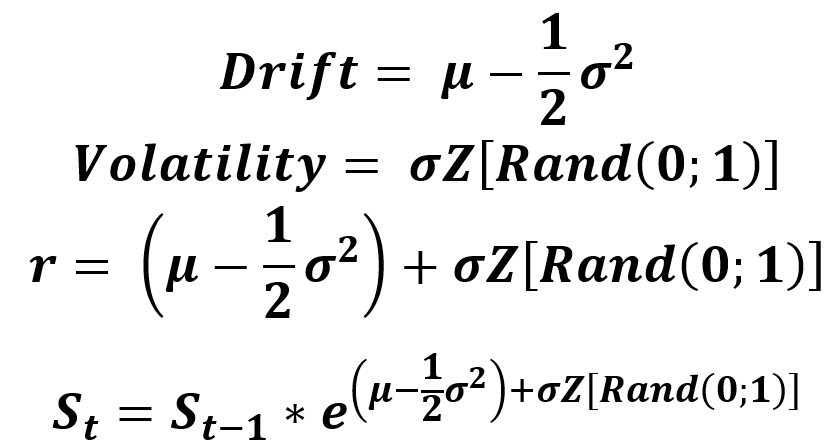

"몬테 카를로 방법 또는 몬테 카를로 실험은 수치 결과를 얻기 위해 반복적인 무작위 샘플링에 의존하는 광범위한 계산 알고리즘이다. 기본 개념은 원칙적으로 결정적일 수 있는 문제를 해결하기 위해 무작위성을 사용하는 것이다. 물리 및 수학 문제에서 자주 사용되며 다른 접근 방식을 사용하는 것이 어렵거나 불가능할 때 가장 유용하다. 몬테카를로 방법은 주로 최적화, 수치적분, 확률분포에서 도출하는 세 가지 문제 클래스에서 사용된다.

In [54]:
# 정규화한 close값 나타냄
dataframe_simulation = download_dataframe(name='PETR3.SA', start_date='2014-01-01', end_date='2018-02-02')
dataframe_simulation_norm = get_data_normalize(dataframe_simulation)
dataframe_simulation = dataframe_simulation['Close']
dataframe_simulation_norm = dataframe_simulation_norm['Close']
dataframe_simulation_norm.head(10)

Date
2014-01-02    15.82
2014-01-03    15.50
2014-01-06    15.69
2014-01-07    15.20
2014-01-08    15.21
2014-01-09    14.80
2014-01-10    15.01
2014-01-13    14.71
2014-01-14    14.65
2014-01-15    15.12
Name: Close, dtype: float64

In [55]:
# 정규화한 close값에 로그를 씌운 값
dataframe_simulation_rt=np.log(1+dataframe_simulation_norm.pct_change())
dataframe_simulation_rt.fillna(0,inplace=True)
dataframe_simulation_rt

Date
2014-01-02    0.000000
2014-01-03   -0.020435
2014-01-06    0.012184
2014-01-07   -0.031728
2014-01-08    0.000658
                ...   
2018-01-29    0.000000
2018-01-30   -0.024716
2018-01-31    0.005650
2018-02-01    0.038227
2018-02-02   -0.027022
Name: Close, Length: 1021, dtype: float64

In [56]:
# Drift 지수 구하기 : 식은 위의 사진 참조
drift=dataframe_simulation_rt.mean() - (0.5 * dataframe_simulation_rt.var())
print(f'Drift:{drift}')

Drift:-0.00025066754660572703


<AxesSubplot:ylabel='Count'>

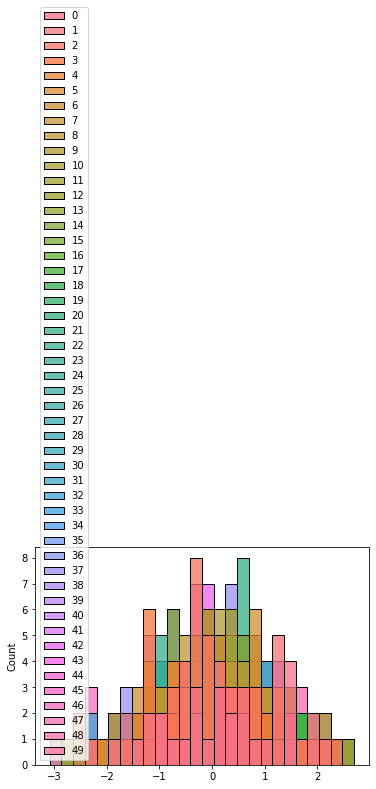

In [57]:
days_prev_len=30
simulations=50
Z=stats.norm.ppf(np.random.rand(days_prev_len,simulations))
sns.histplot(Z)

In [58]:
def get_plot_pred(predictions:list):
    fig=px.line(title='Simulations')
    for i in range(len(predictions.T)):
        fig.add_scatter(y=predictions.T[i],name=i)
    fig.update_layout(paper_bgcolor='white',plot_bgcolor='white',font_color='black')
    fig.show()
    
df_std=dataframe_simulation_rt.std() # 표준편차
days_rt=np.exp(drift+df_std*Z) # 밑이 자연상수 e인 지수함수(e^x)로 변환
days_pred=np.zeros_like(days_rt) # 어떤 특정 array와 같은 사이즈, 크기의 zeros_array구할때 사용
days_pred[0] = dataframe_simulation.iloc[-1]

for i in range(1,days_prev_len):
    days_pred[i]=days_pred[i - 1] * days_rt[i]
get_plot_pred(days_pred)

In [59]:
dataframe_stock_new = download_dataframe(name='PETR3.SA', start_date='2018-02-03', end_date='2018-12-20')
dataframe_stock_new = dataframe_stock_new['Close']

s = days_pred.T[0][0:len(dataframe_stock_new)]

In [60]:
from sklearn.metrics import mean_absolute_error

dataframe_stock_new=dataframe_stock_new[0:days_prev_len]
mean_absolute_error(dataframe_stock_new,s)

sqerror=list()
for i in range(len(days_pred.T)):
    sqerror.append(mean_absolute_error(dataframe_stock_new,days_pred.T[i][0:days_prev_len]))

In [61]:
def plot_best_predict(df: dict, index_max: int, index_min: int):
    fig = px.line(title='Predict Simulation - Monte Carlo')
    fig.add_scatter(y=df, name='value')
    fig.add_scatter(y=days_pred.T[index_max], name='biggest pred error')
    fig.add_scatter(y=days_pred.T[index_min], name='smallest pred error')
    fig.update_traces(mode='markers+lines')
    fig.update_layout(paper_bgcolor='white', plot_bgcolor="white", font_color="black")
    fig.show()

index_min = np.argmin(sqerror)
index_max = np.argmax(sqerror)
plot_best_predict(dataframe_stock_new, index_max, index_min)

## 시계열예측 : ARIMA
- 과거의 시계열 데이터를 가지고 예측하는 모델이며, 두 가지 변수(시계열, 종속 변수)를 가지고 모델을 훈련
- ARIMA의 조건
    - DATA가 정상적이여야 함.
    - 계절성

In [62]:
times_series = download_dataframe(name='PETR3.SA', start_date='2007-01-01', end_date='2020-02-02')
times_series_v2 = times_series.copy()

In [63]:
times_series.dropna(inplace=True)
times_series=times_series['Close']
len(times_series)

3244

In [64]:
percent=int(len(times_series) * 0.90)
times_series_train=times_series[:percent]
times_series_test=times_series[percent:]

print(f'Train: {len(times_series_train)}, Test : {len(times_series_test)}')

print(f'Train > First_date: {times_series_train.index.min()} - Final_date: {times_series_train.index.max()}')
print(f'Test > First_date: {times_series_test.index.min()} - Final_date: {times_series_test.index.max()}')

Train: 2919, Test : 325
Train > First_date: 2007-01-02 00:00:00 - Final_date: 2018-10-04 00:00:00
Test > First_date: 2018-10-05 00:00:00 - Final_date: 2020-01-31 00:00:00


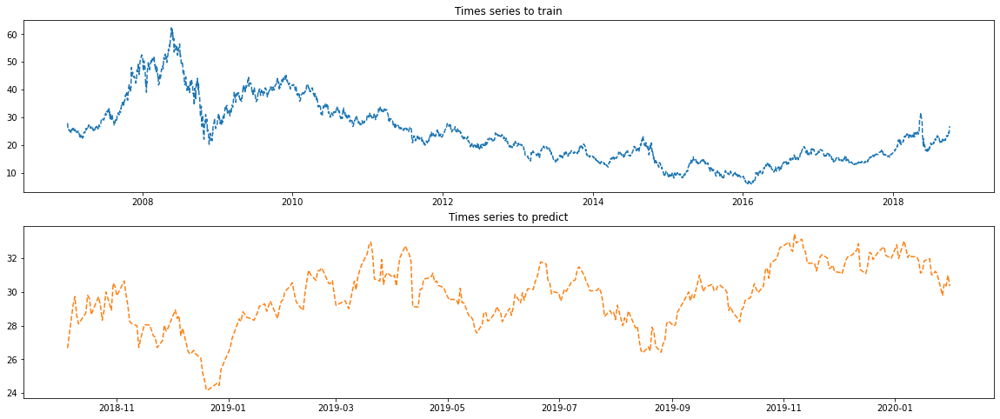

In [65]:
def plot_line(df_1 : dict,df_2:dict):
    fig=plt.figure(figsize=(20,8))
    plt.subplot(211)
    plt.title('Times series to train')
    plt.plot(df_1,color='tab:blue',linestyle='--')
    
    plt.subplot(212)
    plt.title('Times series to predict')
    plt.plot(df_2,color='tab:orange',linestyle='--')
    plt.show()
    
def plot_line_tedency(df: dict):

    fig = plt.figure(figsize=(20, 8))
    plt.subplot(211)
    plt.title("Times series - trend")
    plt.plot(df.trend, color='tab:blue', linestyle='--')

    plt.subplot(212)
    plt.title("Times series - resid")
    plt.plot(df.resid, color='tab:orange', linestyle='--')
    
times_series.head(10)
plot_line(times_series_train,times_series_test)  

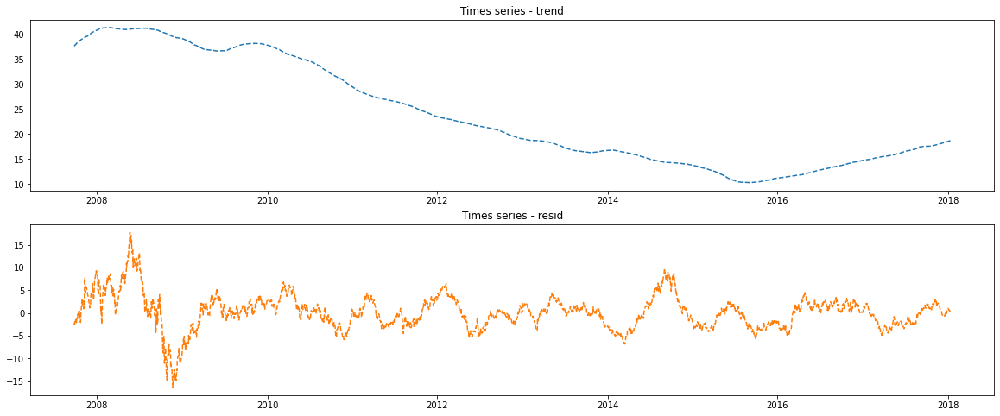

In [66]:
# 시계열 분해 : seasonal_decompose
times_series_stats=seasonal_decompose(times_series_train,period=365)
plot_line_tedency(times_series_stats)

In [67]:
def build_model(times_series_train: dict):
    return auto_arima(times_series_train, suppress_warnings=True, error_action='ignore')


def model_predict(model, period):
    return model.predict(n_periods=period)

In [68]:
model = build_model(times_series_train)
pred = model_predict(model, len(times_series_test))
pred = pd.DataFrame(pred, columns=['pred_value'], index=times_series_test.index)
show_table(pred.head(20))

In [69]:
def plot_arima_pred(train:dict,test:dict,pred:dict):
    plt.figure(figsize=(20,4))
    config={'name':['train','test','predict'],
           'color':['green','orange','red'],
           'data':[train,test,pred]}
    
    for i in range(3):
        plt.plot(config['data'][i],label=config['name'][i],color=config['color'][i])
        plt.legend()

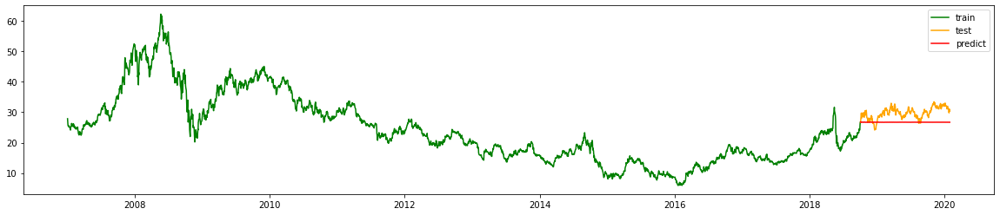

In [70]:
plot_arima_pred(times_series_train,times_series_test,pred)

In [71]:
print(f'Absolute error: {mean_absolute_error(times_series_test, pred)}')

Absolute error: 3.183521892380022


## 시계열 예측 : PROPHET
- 페이스북이 만든 시계열 예측 라이브러리
    - 통계적 지식이 없어도 직관적 파라미터를 통해 모형을 조정할 수 있음
    - 일반적인 경우 기본값만 사용해도 높은 성능을 보여줌


In [72]:
times_series_v2 = format_index(times_series_v2)
times_series_v2.reset_index(drop=True, inplace=True)
times_series_v2 = times_series_v2[["DateIndex", "Close"]]
times_series_v2 = times_series_v2[["DateIndex", "Close"]].rename(columns={'Close': 'y', 'DateIndex': 'ds'})
times_series_train_v2 = times_series_v2.iloc[:percent, [0, 1]]
times_series_test_v2 = times_series_v2.iloc[percent:, [0, 1]]

## 여기서부터는 커널이 죽어서 실행이 안되네요...

In [ ]:
print(f"Train: {len(times_series_train_v2)} Test: {len(times_series_test_v2)}")
model_prophet = Prophet()
model_prophet.fit(times_series_train_v2)

Train: 2919 Test: 325


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


KeyError: 'metric_file'

Exception ignored in: 'stanfit4anon_model_f5236004a3fd5b8429270d00efcc0cf9_9045703871880297330._set_stanargs_from_dict'
Traceback (most recent call last):
  File "C:\anaconda\lib\site-packages\pystan\model.py", line 550, in optimizing
    ret, sample = fit._call_sampler(stan_args)
KeyError: 'metric_file'


In [2]:
pred_prophet = model_prophet.predict(model_prophet.make_future_dataframe(periods=len(times_series_test_v2)))
predict = pred_prophet['yhat'].tail(len(times_series_test_v2))
error = mean_absolute_error(times_series_test_v2['y'], predict)
print(f"Mean absolute error: {error}")

NameError: name 'model_prophet' is not defined

In [ ]:
plot_plotly(model_prophet, pred_prophet)